In [29]:
from pandas import read_csv
from pandas import datetime
from matplotlib import pyplot
series = read_csv('Atrium1.csv', header=0, parse_dates=[0], index_col=0, squeeze=True)
print(series.head())

mydata$date
2013-02-01    294
2013-03-01    272
2013-04-01    195
2013-05-01    267
2013-06-01    311
Name: Item_Count_Per_Day, dtype: int64


In [30]:
series.isnull().sum()

0

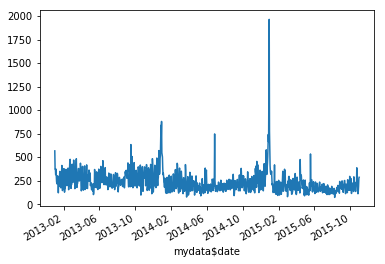

In [31]:
series.plot()
pyplot.show()

C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\site-packages\ipykernel_launcher.py:2: FutureWarning: 'pandas.tools.plotting.autocorrelation_plot' is deprecated, import 'pandas.plotting.autocorrelation_plot' instead.
  


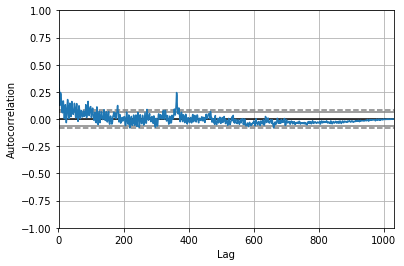

In [32]:
from pandas.tools.plotting import autocorrelation_plot
autocorrelation_plot(series)
pyplot.show()

### Checking Stationarity

In [33]:
from pandas import Series
from statsmodels.tsa.stattools import adfuller
series = Series.from_csv('Atrium1.csv', header=0)
X = series.values
result = adfuller(X)
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])
print('Critical Values:')
for key, value in result[4].items():
	print('\t%s: %.3f' % (key, value))

ADF Statistic: -7.357292
p-value: 0.000000
Critical Values:
	1%: -3.437
	5%: -2.864
	10%: -2.568


C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\site-packages\pandas\core\series.py:3724: FutureWarning: from_csv is deprecated. Please use read_csv(...) instead. Note that some of the default arguments are different, so please refer to the documentation for from_csv when changing your function calls
  infer_datetime_format=infer_datetime_format)


Dickey-Fuller Test: This is one of the statistical tests for checking stationarity. Here the null hypothesis is that the TS is non-stationary. The test results comprise of a Test Statistic and some Critical Values for difference confidence levels. If the ‘Test Statistic’ is less than the ‘Critical Value’, we can reject the null hypothesis and say that the series is stationary. Refer this article for details

C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\site-packages\pandas\core\series.py:3724: FutureWarning: from_csv is deprecated. Please use read_csv(...) instead. Note that some of the default arguments are different, so please refer to the documentation for from_csv when changing your function calls
  infer_datetime_format=infer_datetime_format)


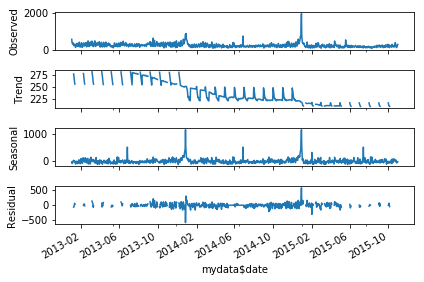

In [34]:
from random import randrange
from pandas import Series
from matplotlib import pyplot
from statsmodels.tsa.seasonal import seasonal_decompose
series = Series.from_csv('Atrium1.csv', header=0)
result = seasonal_decompose(series, model='additive', freq=365)
result.plot()
pyplot.show()

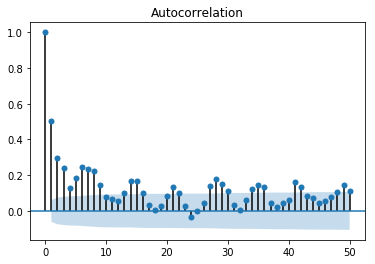

In [35]:
from statsmodels.tsa.stattools import acf, pacf
from matplotlib import pyplot
from statsmodels.graphics.tsaplots import plot_acf
plot_acf(series,lags=50)
pyplot.show()

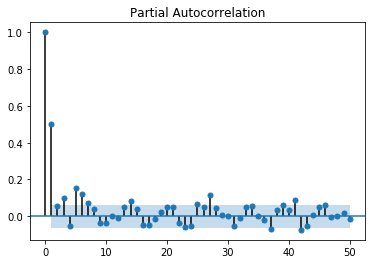

In [36]:
from statsmodels.graphics.tsaplots import plot_pacf
plot_pacf(series,lags=50)
pyplot.show()

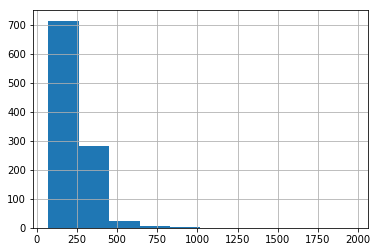

In [37]:
series.hist()
pyplot.show()

C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\site-packages\statsmodels\tsa\base\tsa_model.py:225: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\site-packages\statsmodels\tsa\base\tsa_model.py:225: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)


                              ARIMA Model Results                               
Dep. Variable:     D.Item_Count_Per_Day   No. Observations:                 1029
Model:                   ARIMA(1, 1, 3)   Log Likelihood               -6170.452
Method:                         css-mle   S.D. of innovations             97.043
Date:                  Fri, 12 Oct 2018   AIC                          12352.905
Time:                          13:20:45   BIC                          12382.523
Sample:                               1   HQIC                         12364.146
                                                                                
                                 coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------------
const                         -0.1041      0.026     -3.975      0.000      -0.155      -0.053
ar.L1.D.Item_Count_Per_Day     0.8665      0.058     14.902      0.

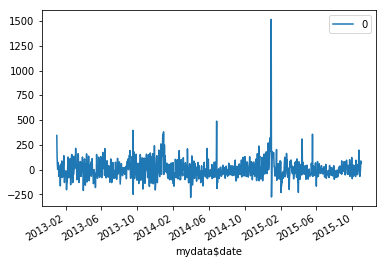

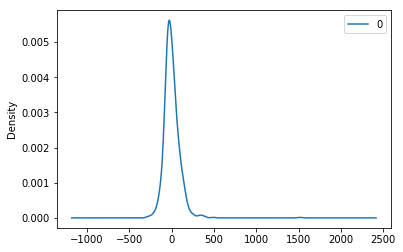

                 0
count  1029.000000
mean      0.805641
std      97.289393
min    -281.326499
25%     -51.305339
50%     -11.626805
75%      40.442964
max    1516.088183


In [38]:
from pandas import read_csv
from pandas import datetime
from pandas import DataFrame
from statsmodels.tsa.arima_model import ARIMA
from matplotlib import pyplot
model = ARIMA(series, order=(1,1,3))
model_fit = model.fit(disp=0)
print(model_fit.summary())
# plot residual errors
residuals = DataFrame(model_fit.resid)
residuals.plot()
pyplot.show()
residuals.plot(kind='kde')
pyplot.show()
print(residuals.describe())

In [39]:
model = ARIMA(series, order=(1,1,3))
model_fit = model.fit(disp=0)
print(model_fit.summary())

C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\site-packages\statsmodels\tsa\base\tsa_model.py:225: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\site-packages\statsmodels\tsa\base\tsa_model.py:225: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)


                              ARIMA Model Results                               
Dep. Variable:     D.Item_Count_Per_Day   No. Observations:                 1029
Model:                   ARIMA(1, 1, 3)   Log Likelihood               -6170.452
Method:                         css-mle   S.D. of innovations             97.043
Date:                  Fri, 12 Oct 2018   AIC                          12352.905
Time:                          13:20:46   BIC                          12382.523
Sample:                               1   HQIC                         12364.146
                                                                                
                                 coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------------
const                         -0.1041      0.026     -3.975      0.000      -0.155      -0.053
ar.L1.D.Item_Count_Per_Day     0.8665      0.058     14.902      0.

In [40]:
from pandas import read_csv
from pandas import datetime
from matplotlib import pyplot
from statsmodels.tsa.arima_model import ARIMA
from sklearn.metrics import mean_squared_error

In [41]:
X = series.values
size = int(len(X) * 0.66)
train, test = X[0:size], X[size:len(X)]

predicted=246.588802, expected=287.000000
predicted=251.461687, expected=186.000000
predicted=205.575470, expected=141.000000
predicted=177.223888, expected=148.000000
predicted=173.179823, expected=228.000000
predicted=217.825606, expected=144.000000
predicted=202.780782, expected=222.000000
predicted=242.934613, expected=186.000000
predicted=208.119322, expected=118.000000
predicted=162.870192, expected=252.000000
predicted=203.935179, expected=220.000000
predicted=196.943771, expected=125.000000
predicted=188.114545, expected=183.000000
predicted=222.693157, expected=148.000000
predicted=198.016808, expected=171.000000
predicted=195.285756, expected=113.000000
predicted=154.780952, expected=173.000000
predicted=174.098535, expected=112.000000
predicted=153.239972, expected=135.000000
predicted=178.113281, expected=253.000000
predicted=230.793941, expected=136.000000
Test MSE: 3653.770


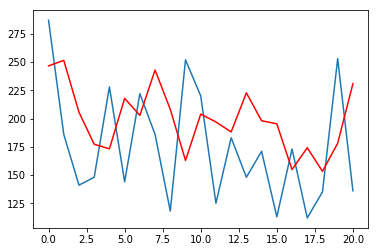

In [42]:
X = series.values
size = int(len(X) * 0.98)
train, test = X[0:size], X[size:len(X)]
history = [x for x in train]
predictions = list()
for t in range(len(test)):
	model = ARIMA(history, order=(5,0,3))
	model_fit = model.fit(disp=0)
	output = model_fit.forecast()
	yhat = output[0] 
	predictions.append(yhat)
	obs = test[t]
	history.append(obs)
	print('predicted=%f, expected=%f' % (yhat, obs))
error = mean_squared_error(test, predictions)
print('Test MSE: %.3f' % error)
# plot
pyplot.plot(test)
pyplot.plot(predictions, color='red')
pyplot.show()

In [46]:
fcast = forecast(model_fit, h=60)
plot(fcast)

NameError: name 'forecast' is not defined

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\se

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\se

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\se

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\se

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\se

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\se

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\se

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\se

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\se

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\se

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\se

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\se

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\se

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] An existing connection was forcibly closed by the remote host
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\events.py", line 145, in _run
    self._callback(*self._args)
  File "C:\Users\User\AppData\Local\conda\conda\envs\py36\lib\asyncio\selector_events.py", line 141, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetErro